In [1]:
import numpy as np
import matplotlib
import scipy.signal as signal
import matplotlib.pyplot as plt
from scipy.io import wavfile
from IPython.display import Audio

matplotlib.rcParams['figure.figsize'] = (15, 7)

In [2]:
# load data
fs, data = wavfile.read("lick.wav")

# convert to mono
data = data.sum(axis=1) / 2
Audio(data, rate=fs)

/opt/software/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7626: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


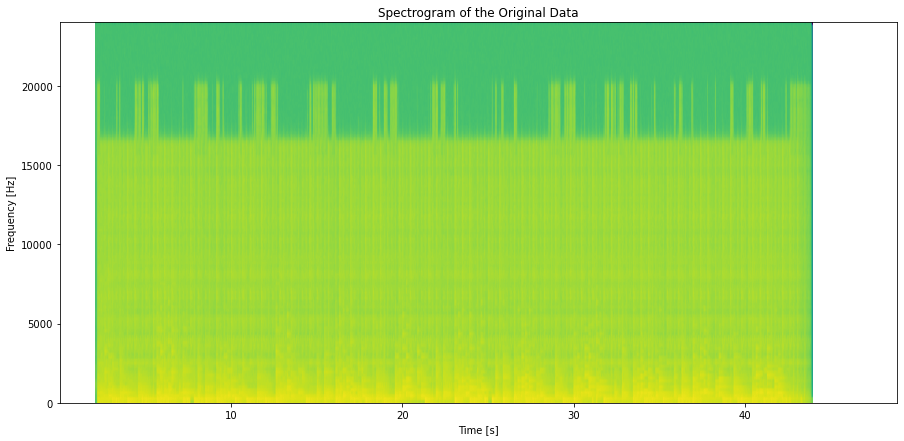

In [3]:
plt.specgram(data, Fs=fs)
plt.xlabel("Time [s]")
plt.ylabel("Frequency [Hz]")
plt.title("Spectrogram of the Original Data")
plt.show()

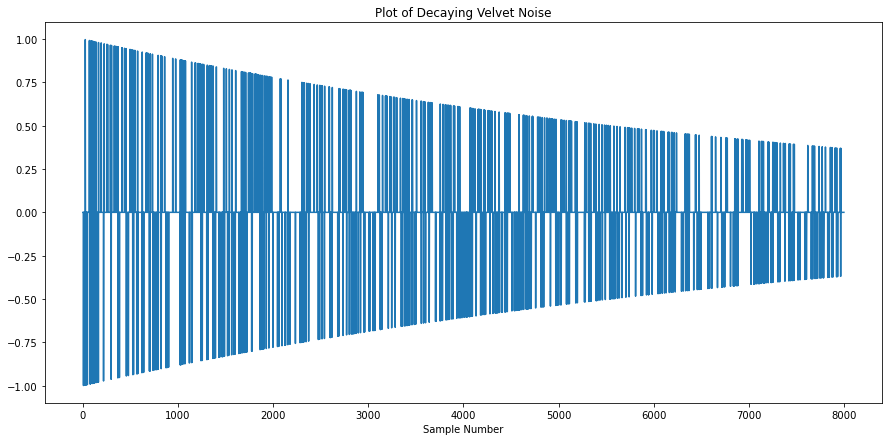

In [8]:
noise_percent = 0.1
noise_length = 8000
decay_factor = 1
indices = np.random.randint(0, noise_length - 1, size=int(noise_percent*noise_length))
velvet_noise = np.zeros(noise_length)
velvet_noise[indices[:indices.size // 2]] = 1
velvet_noise[indices[indices.size // 2:]] = -1
velvet_noise = velvet_noise * np.exp(-decay_factor / noise_length * np.arange(noise_length))
plt.title("Plot of Decaying Velvet Noise")
plt.xlabel("Sample Number")
plt.plot(velvet_noise)

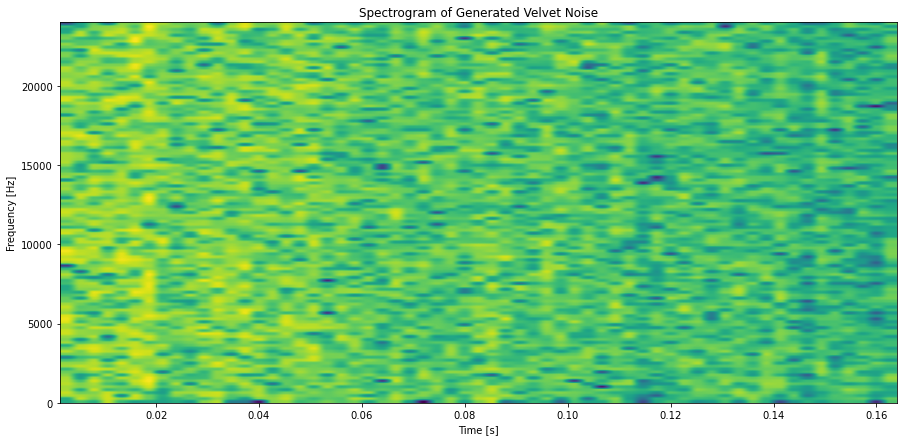

In [5]:
plt.specgram(velvet_noise, Fs=fs)
plt.title("Spectrogram of Generated Velvet Noise")
plt.xlabel("Time [s]")
plt.ylabel("Frequency [Hz]")
plt.show()

In [6]:
reverberated = np.convolve(data, velvet_noise)
Audio(reverberated, rate=fs)

/opt/software/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7626: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


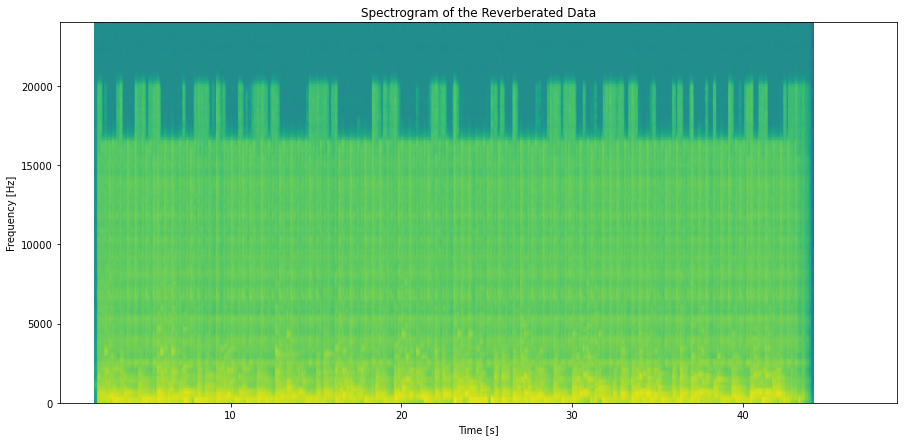

In [7]:
plt.specgram(reverberated, Fs=fs)
plt.xlabel("Time [s]")
plt.ylabel("Frequency [Hz]")
plt.title("Spectrogram of the Reverberated Data")
plt.show()